# Calculating the LSD profiles

## 0 Packages and data

In [1]:
path='G:/Shared drives/BeStarsMiMeS/UpdatedFiles/' #Patrick's google file stream path

In [2]:
import LSDpy.lsdpy as lsdpy

In [3]:
import specpolFlow as pol
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import astropy.constants as const
from matplotlib.backends.backend_pdf import PdfPages

In [4]:
import pandas as pd
sheet_id = '1M6y1Wnsrc-w5FjUMfKaSFa_-foIDAaMe8W4lYNWnWyk'
sheet_name = 'Stars'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
StarData=pd.read_csv(url)

sheet_name = 'Observations'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
Observations=pd.read_csv(url)

In [5]:
import itertools

### This gets rid of the warnings in the cells where it is creating more than 20 figures (i.e. 1.2)
#### Not needed for this notebook but could be useful in the future
#import warnings
#warnings.filterwarnings("default", message="More than 20 figures have been opened.")


## Graph of line masks for comparison (one case)

There is also a table in Pandas format at the end, to compare the numerical values



In [6]:
Observations

,1,Unnamed: 1,Unnamed: 2,Name,LSDfileName,NameAsif,NameOfMask,Unnamed: 7,NameOfSymbolicLinkToData,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,185,1.0,1,hd6226,hd6226_1.lsd.s,hd6226_1,mask_T15000g40lamb3700_9000.dat,0,hd6226_11AP14_1310132pnv.s,110.34,-60.297909,-70.000000,NaN,NaN,NaN
1,193,2.0,1,hd7636,hd7636_1.lsd.s,hd7636_1,mask_T15000g40lamb3700_9000.dat,0,hd7636_11AP14_1314767pnv.s,230.00,0.000000,0.000000,NaN,NaN,NaN
2,194,2.0,2,hd7636,hd7636_2.lsd.s,hd7636_2,mask_T15000g40lamb3700_9000.dat,0,hd7636_11AP14_1316457pnv.s,230.00,0.000000,0.000000,NaN,NaN,NaN
3,2,3.0,1,hd10144,hd10144_1.lsd.s,hd10144_1,mask_T20000g35lamb3700_9000.dat,1,hd10144_187.D-0917A_2011-12-11_01_pnv.s,245.31,12.981952,12.981952,NaN,NaN,NaN
4,3,4.0,1,hd10516,hd10516_1.lsd.s,hd10516_1,mask_T25000g40lamb3700_9000.dat,0,hd10516_11AP14_1311181pnv.s,382.04,-60.990786,-60.990786,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,137,74.0,1,hd221507,hd221507_1.lsd.s,hd221507_1,mask_T10500g40lamb3700_9000.dat,1,hd221507_187.D-0917A_2012-07-19_01_pnv.s,20.00,0.000072,0.000072,NaN,NaN,NaN
197,140,75.0,1,hd224686,hd224686_1.lsd.s,hd224686_1,mask_T13000g40lamb3700_9000.dat,1,hd224686_187.D-0917A_2011-12-09_01_pnv.s,286.16,11.694301,11.694301,NaN,NaN,NaN
198,141,75.0,2,hd224686,hd224686_2.lsd.s,hd224686_2,mask_T13000g40lamb3700_9000.dat,1,hd224686_187.D-0917A_2011-12-12_01_pnv.s,286.16,8.724928,8.724928,NaN,NaN,NaN
199,145,76.0,1,hd239712,hd239712_1.lsd.s,hd239712_1,mask_T21000g40lamb3700_9000.dat,0,hd239712_11BP14_1331344pnv.s,304.86,-0.002959,-0.002959,NaN,NaN,NaN


In [77]:
#hd = 'hd148184' # A star with a lot of emission
hd = 'hd189687' # A well behaved star
#hd='hd6226'
star = StarData[StarData["Name"]==hd]

obs = Observations[Observations["Name"] == hd]

o = 1
ob = obs[obs["Unnamed: 2"]==o]

star
ob

modelcode = star["ModelCode"].item().upper()
maskUS = '{}02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,modelcode)
maskAsifSuperClean = '{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,hd,o)
maskAsifCleanTweak = '{}02-Mask-calculations/MaskCleaning/AsifMaskSuperCleanTweak_tellClean/{}_clean_{}.mask_auto_twk'.format(path,hd,o)

synth_name = '{}01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(path,hd, o)
obs_name = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,hd, o)

mk_AsifClean = pol.read_mask(fname=maskAsifSuperClean)
mk_AsifCleanTweak = pol.read_mask(fname=maskAsifCleanTweak)
mk_US = pol.read_mask(fname=maskUS)

spec_obs = pol.read_spectrum(obs_name)
spec_synth = pol.read_spectrum(synth_name)

Text(0.5, 1.0, 'hd189687; Residual Sum: 0.004; Number of Differences >= 0.02: 0')

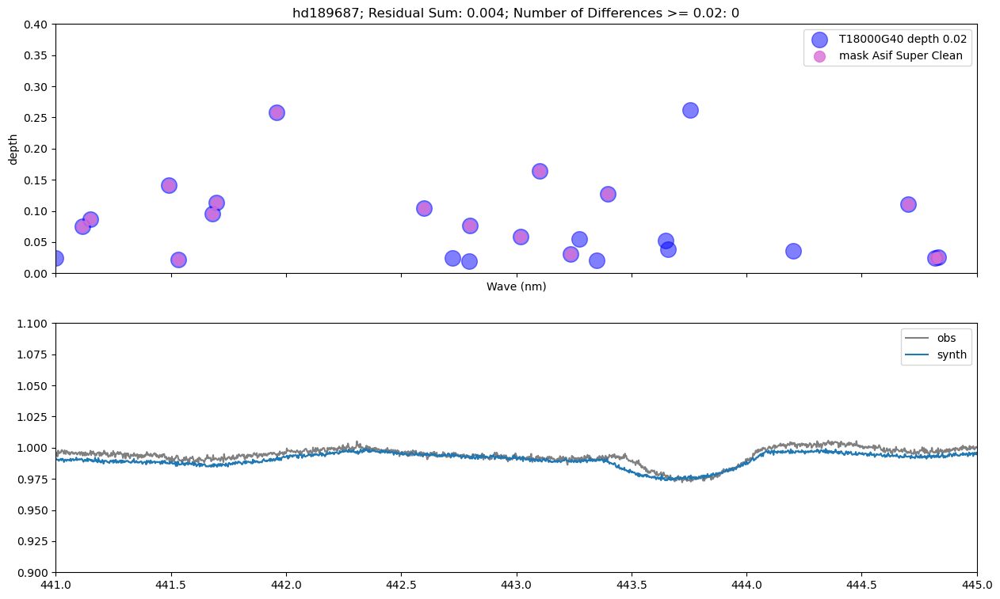

In [90]:
fig, ax = plt.subplots(2,1, figsize=(15,9), sharex=True)
ax[0].set_ylabel('depth')
ax[0].set_xlabel('Wave (nm)')
n = mk_US.iuse == 1
ax[0].scatter(mk_US.wl[n], mk_US.depth[n], label='{} depth 0.02'.format(modelcode), s=200, alpha=0.5, c='blue')

n = mk_AsifClean.iuse == 1
ax[0].scatter(mk_AsifClean.wl[n], mk_AsifClean.depth[n], label='mask Asif Super Clean', s=100, alpha=0.8, c='orchid')

n = mk_AsifClean.iuse == 1
#ax[0].scatter(mk_AsifCleanTweak.wl[n], mk_AsifCleanTweak.depth[n], label='mask Asif Super Clean and tweak', c='k')

ax[0].legend(loc=0)
ax[0].set_ylim(0,0.4)
#ax[0].set_xlim(420,455)
ax[0].set_xlim(441,445)

ax[1].plot(spec_obs.wl, spec_obs.specI, c='0.5', label='obs')
ax[1].plot(spec_synth.wl, spec_synth.specI, label='synth')
ax[1].legend(loc=0)
ax[1].set_ylim(0.9,1.1)



n=np.intersect1d(mk_US.wl[mk_US.iuse == 1],mk_AsifClean.wl[mk_AsifClean.iuse==1],return_indices=True)[1]
n2=np.intersect1d(mk_AsifClean.wl[mk_AsifClean.iuse==1],mk_US.wl[mk_US.iuse == 1],return_indices=True)[1]

resid=mk_US.depth[mk_US.iuse == 1][n]-mk_AsifClean.depth[mk_AsifClean.iuse==1][n2]
diffs=resid[np.where(np.abs(resid)>=0.02)[0]]

ax[0].set_title('{}; Residual Sum: {}; Number of Differences >= 0.02: {}'.format(hd,np.sum(resid),diffs.size))

## PDF of all stars

C:\Users\pjsta\AppData\Local\Temp\ipykernel_22656\4232906438.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2,1, figsize=(15,9), sharex=True)


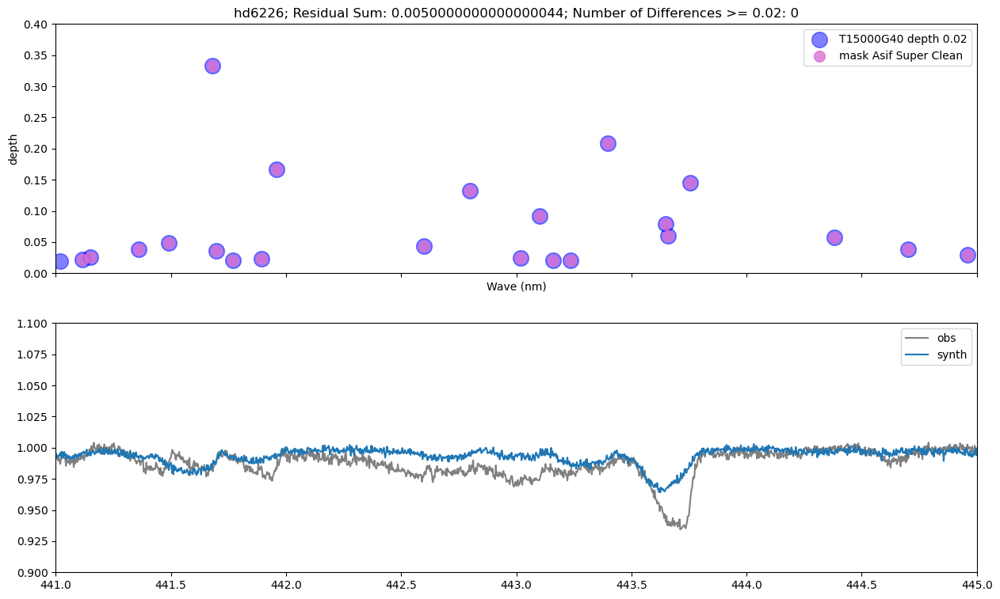

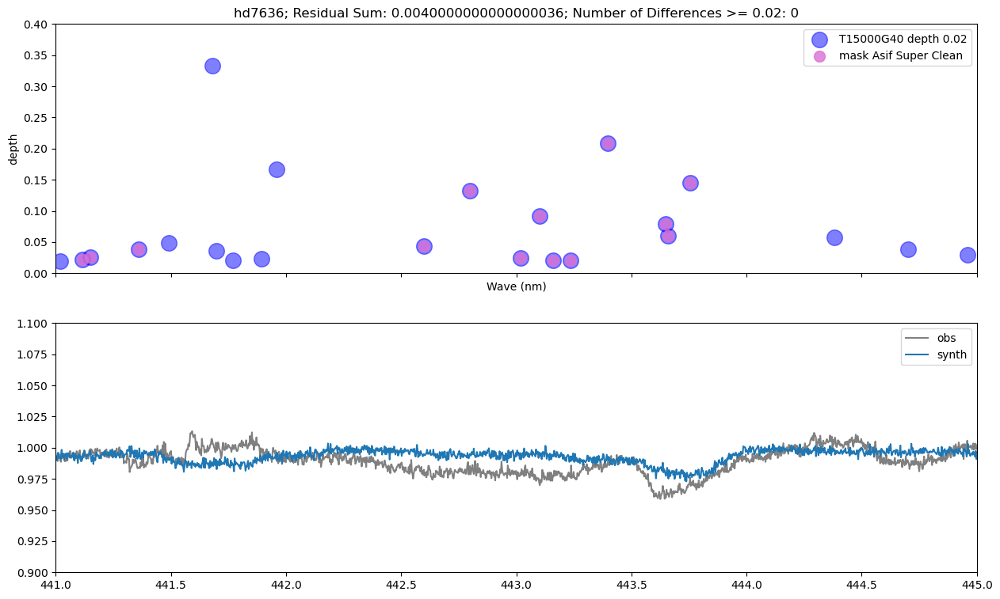

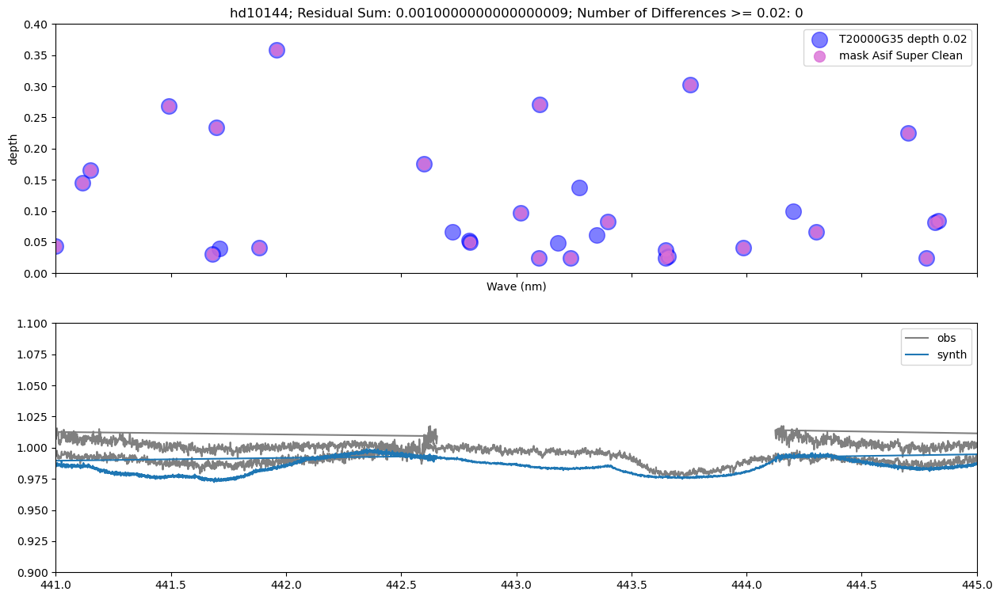

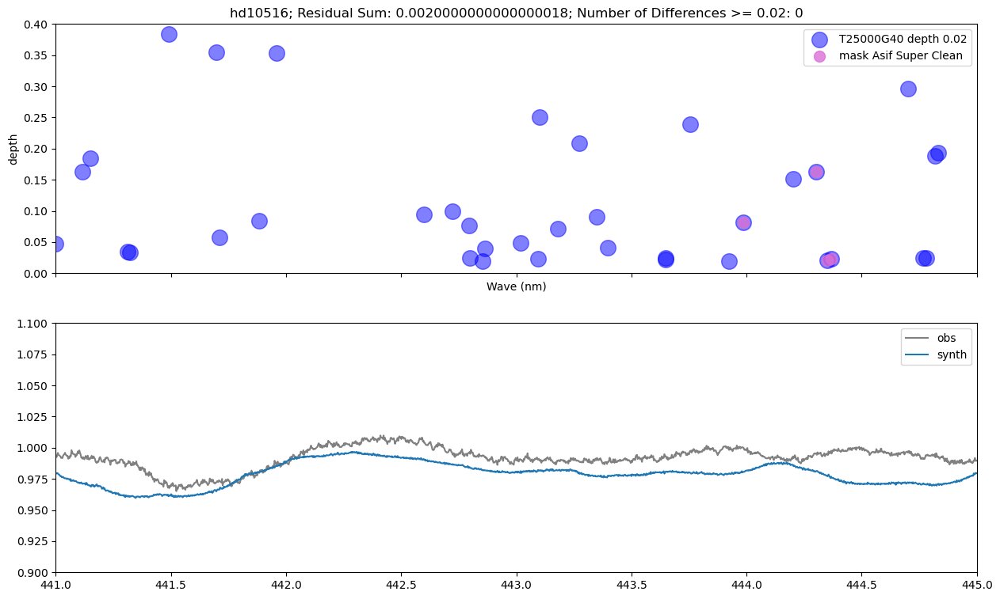

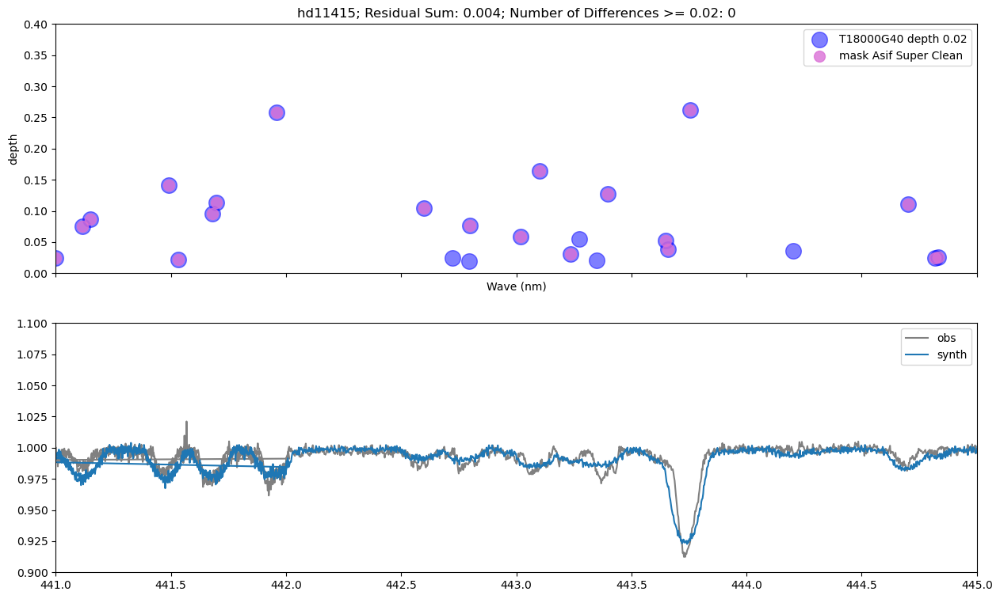

...

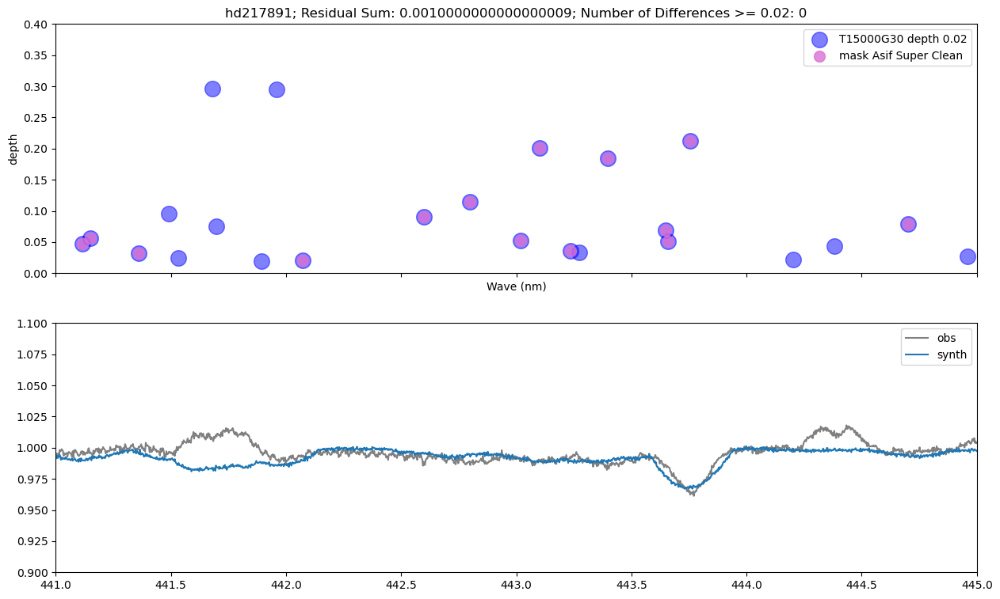

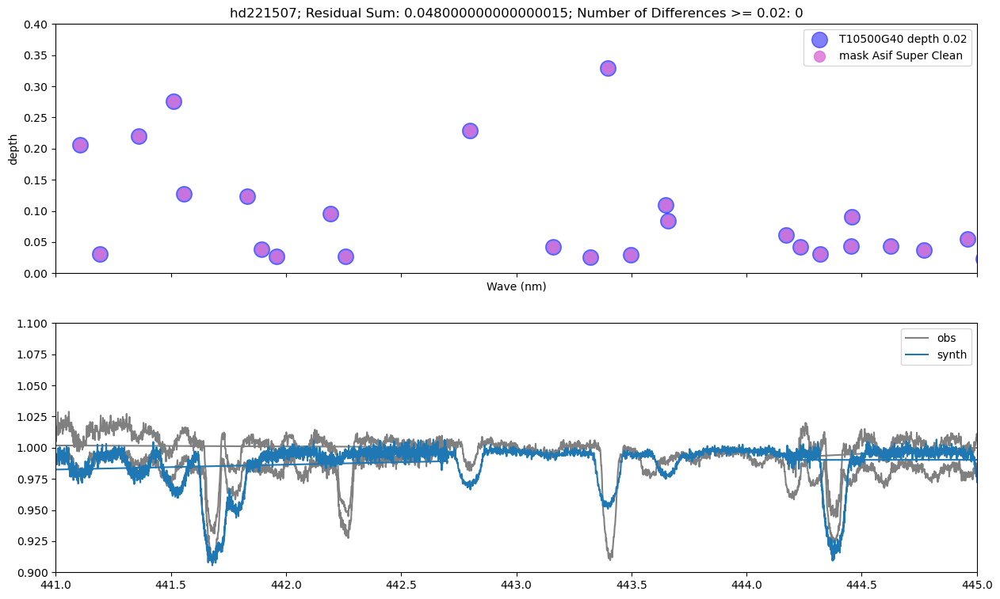

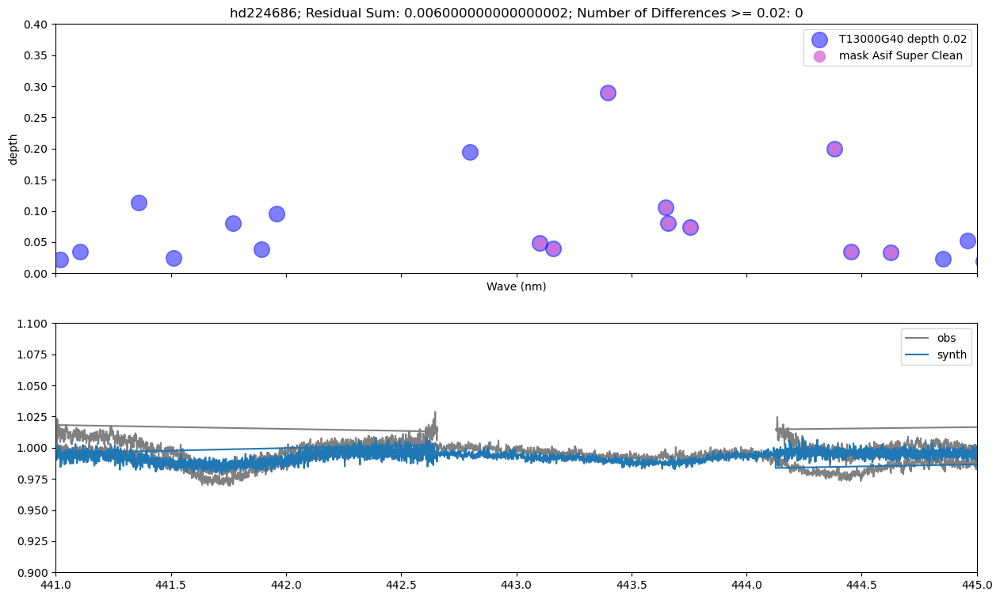

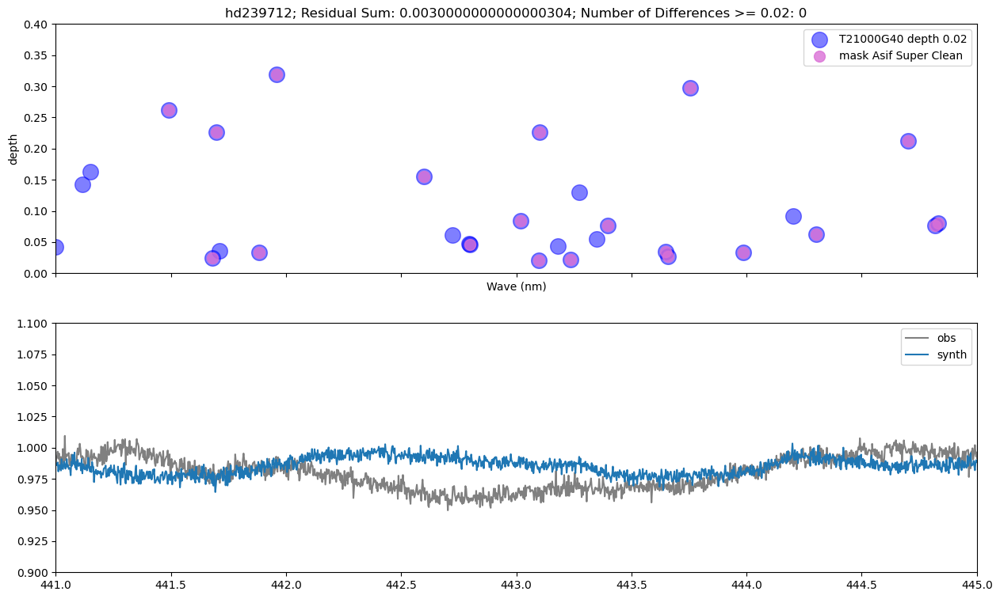

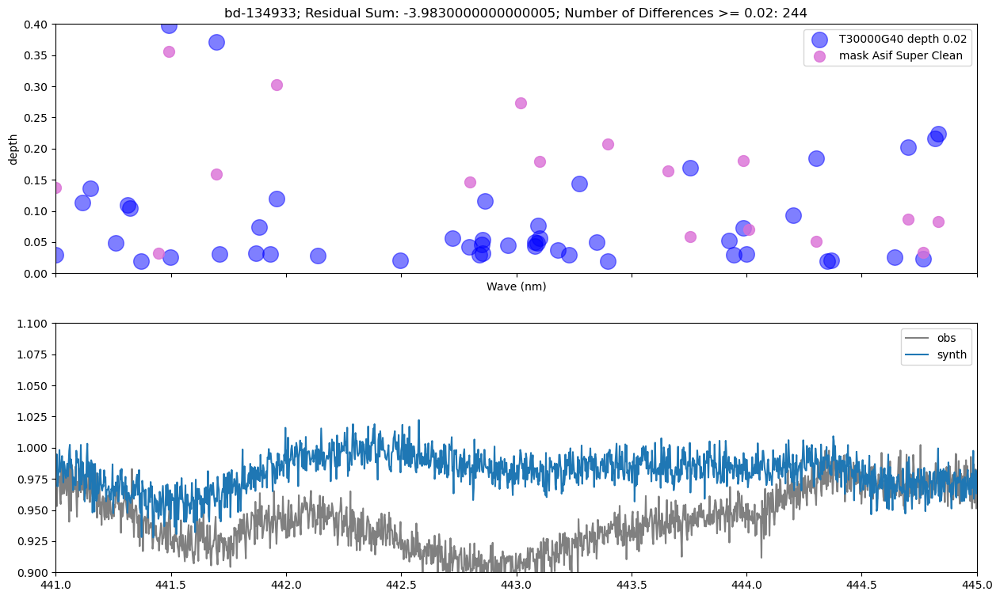

In [92]:

with PdfPages('{}11-MaskComparison/depthcomparison.pdf'.format(path)) as pdf:
    for i in range(len(StarData)): #Loops over all the stars in StarData


        star = StarData['Name'][i]

        obs = Observations[Observations["Name"] == star]

        o = 1
        ob = obs[obs["Unnamed: 2"]==o]

        star
        ob

        modelcode = StarData["ModelCode"][i].upper()
        maskUS = '{}02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,modelcode)
        maskAsifSuperClean = '{}02-Mask-calculations/MaskCleaning/AsifMaskSuperClean_tellClean/{}_clean_{}.mask'.format(path,star,o)
        #maskAsifCleanTweak = '{}02-Mask-calculations/MaskCleaning/AsifMaskSuperCleanTweak_tellClean/{}_clean_{}.mask_auto_twk'.format(path,star,o)

        synth_name = '{}01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(path,star, o)
        obs_name = '{}00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(path,star, o)

        mk_AsifClean = pol.read_mask(fname=maskAsifSuperClean)
        #mk_AsifCleanTweak = pol.read_mask(fname=maskAsifCleanTweak)
        mk_US = pol.read_mask(fname=maskUS)

        spec_obs = pol.read_spectrum(obs_name)
        spec_synth = pol.read_spectrum(synth_name)


        fig, ax = plt.subplots(2,1, figsize=(15,9), sharex=True)
        ax[0].set_ylabel('depth')
        ax[0].set_xlabel('Wave (nm)')
        n = mk_US.iuse == 1
        ax[0].scatter(mk_US.wl[n], mk_US.depth[n], label='{} depth 0.02'.format(modelcode), s=200, alpha=0.5, c='blue')

        n = mk_AsifClean.iuse == 1
        ax[0].scatter(mk_AsifClean.wl[n], mk_AsifClean.depth[n], label='mask Asif Super Clean', s=100, alpha=0.8, c='orchid')

        n = mk_AsifClean.iuse == 1
        #ax[0].scatter(mk_AsifCleanTweak.wl[n], mk_AsifCleanTweak.depth[n], label='mask Asif Super Clean and tweak', c='k')

        ax[0].legend(loc=0)
        ax[0].set_ylim(0,0.4)
        #ax[0].set_xlim(420,455)
        ax[0].set_xlim(441,445)

        ax[1].plot(spec_obs.wl, spec_obs.specI, c='0.5', label='obs')
        ax[1].plot(spec_synth.wl, spec_synth.specI, label='synth')
        ax[1].legend(loc=0)
        ax[1].set_ylim(0.9,1.1)

        n=np.intersect1d(mk_US.wl[mk_US.iuse == 1],mk_AsifClean.wl[mk_AsifClean.iuse==1],return_indices=True)[1]
        n2=np.intersect1d(mk_AsifClean.wl[mk_AsifClean.iuse==1],mk_US.wl[mk_US.iuse == 1],return_indices=True)[1]

        resid=mk_US.depth[mk_US.iuse == 1][n]-mk_AsifClean.depth[mk_AsifClean.iuse==1][n2]
        diffs=resid[np.where(np.abs(resid)>=0.02)[0]]

        ax[0].set_title('{}; Residual Sum: {}; Number of Differences >= 0.02: {}'.format(star,np.sum(resid),diffs.size))



        pdf.savefig(fig)

In [10]:
import pandas as pd

n = mk_US.wl>=441
nA = mk_AsifClean.wl >=441
nAT = mk_AsifCleanTweak.wl >=441

t = 15

dic = {
       'US wl':mk_US.wl[n][0:t],
       'US el':mk_US.element[n][0:t],
       'US d':mk_US.depth[n][0:t],
       'US iuse':mk_US.iuse[n][0:t],
       'A wl':mk_AsifClean.wl[nA][0:t],
       'A el':mk_AsifClean.element[nA][0:t],
       'A d':mk_AsifClean.depth[nA][0:t],
       'A iuse':mk_AsifClean.iuse[nA][0:t],
       'AT wl':mk_AsifCleanTweak.wl[nA][0:t],
       'AT el':mk_AsifCleanTweak.element[nA][0:t],
       'AT d':mk_AsifCleanTweak.depth[nA][0:t],
       'AT iuse':mk_AsifCleanTweak.iuse[nA][0:t]

       }
toto = pd.DataFrame(dic)


In [11]:
toto

,US wl,US el,US d,US iuse,A wl,A el,A d,A iuse,AT wl,AT el,AT d,AT iuse
0,441.1152,6.01,0.075,1,441.0210,26.01,0.015,0,441.0210,26.01,0.0150,0
1,441.1510,6.01,0.087,1,441.1152,6.01,0.075,1,441.1152,6.01,0.0000,1
2,441.4905,8.01,0.141,1,441.1510,6.01,0.087,1,441.1510,6.01,0.0660,1
3,441.5339,16.01,0.022,1,441.4905,8.01,0.141,1,441.4905,8.01,0.0745,1
4,441.6819,26.01,0.096,1,441.5339,16.01,0.022,1,441.5339,16.01,0.0210,1
5,441.6974,8.01,0.114,1,441.6819,26.01,0.096,1,441.6819,26.01,0.0000,1
6,441.9596,26.02,0.258,1,441.6864,16.01,0.012,1,441.6864,16.01,0.0000,1
7,442.6001,18.01,0.105,1,441.6974,8.01,0.114,1,441.6974,8.01,0.1172,1
8,442.7233,7.01,0.025,1,441.8836,16.02,0.013,1,441.8836,16.02,0.0000,1
9,442.7963,7.01,0.020,1,441.8941,26.01,0.011,1,441.8941,26.01,0.0000,1


## Histogram of line depths (one case)

In [30]:
#hd = 'hd148184' # A star with a lot of emission
hd = 'hd189687' # A well behaved star
star = StarData[StarData["Name"]==hd]

obs = Observations[Observations["Name"] == hd]

o = 1
ob = obs[obs["Unnamed: 2"]==o]

star
ob

modelcode = star["ModelCode"].item().upper()
maskUS = path+'/02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(modelcode)
maskAsifClean = path+'/00-InputMaterial/AsifMaskClean/{}_clean_{}.mask'.format(hd,o)
maskAsifCleanTweak = path+'/00-InputMaterial/AsifMaskCleanTweak/{}_clean_{}.mask_auto_twk'.format(hd,o)

synth_name = path+'/01-Synth-calculations/Synth-hybrid-spectra/{}_{}_noise.s'.format(hd, o)
obs_name = path+'/00-InputMaterial/NormalizedSpectra/{}_{}.s'.format(hd, o)

mk_AsifClean = pol.iolsd.read_mask(fname=maskAsifClean)
mk_AsifCleanTweak = pol.iolsd.read_mask(fname=maskAsifCleanTweak)
mk_US = pol.iolsd.read_mask(fname=maskUS)

Text(0.5, 1.0, 'hd189687')

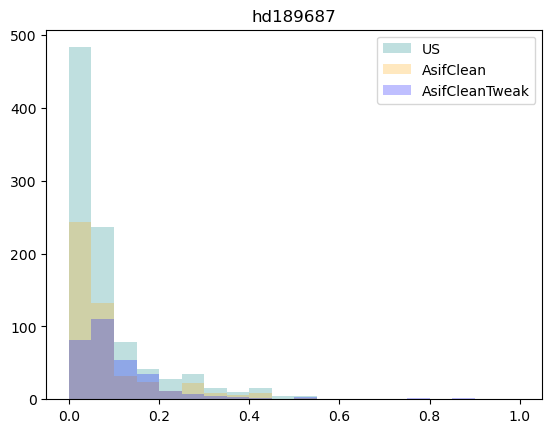

In [41]:
#SET ALL THE ASIF MASK LINE DEPTH CUT OFFS TO BE 0.02 WHICH IS EQUAL TO OUR MASK

fig, ax = plt.subplots(1,1)

h=ax.hist(mk_US.depth[mk_US.iuse==1], label='US', range=[0,1], bins=20, fc='teal', alpha=0.25)
#h=ax.hist(mk_AsifClean.depth[mk_AsifClean.iuse==1], alpha=0.25, label='AsifClean', range=[0,1], bins=20, fc='orange')
h=ax.hist(mk_AsifClean.depth[np.logical_and(mk_AsifClean.iuse==1,mk_AsifClean.depth>=0.02)], alpha=0.25, label='AsifClean', range=[0,1], bins=20, fc='orange')
#h=ax.hist(mk_AsifCleanTweak.depth[np.logical_and(mk_AsifCleanTweak.iuse==1,mk_AsifCleanTweak.depth>=0.0001)],
#          label='AsifCleanTweak', range=[0,1], bins=20, fc='blue', alpha=0.25)
h=ax.hist(mk_AsifCleanTweak.depth[np.logical_and(mk_AsifCleanTweak.iuse==1,mk_AsifCleanTweak.depth>=0.02)],
          label='AsifCleanTweak', range=[0,1], bins=20, fc='blue', alpha=0.25)

ax.legend(loc=0)
ax.set_title(hd)

## PDFs with histograms of line depths for all observations

Original code from Federico

> TODO arrange the paths and run again

C:\Users\pjsta\AppData\Local\Temp/ipykernel_4428/4021396188.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(10,5))


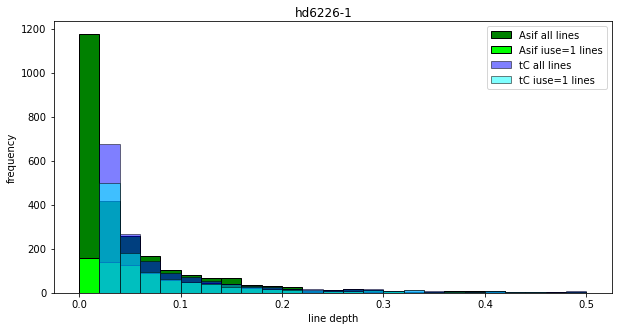

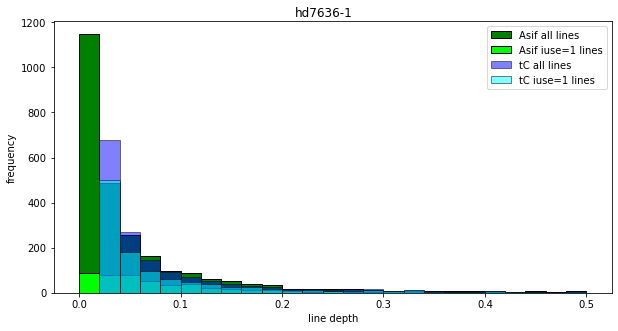

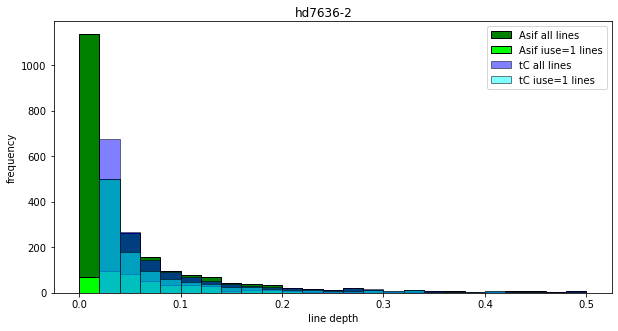

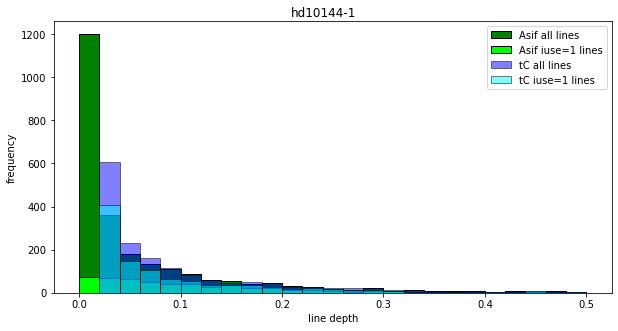

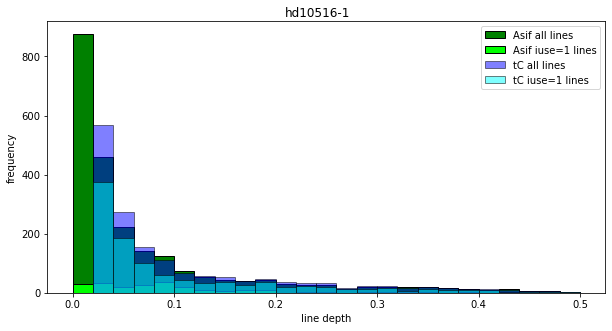

...

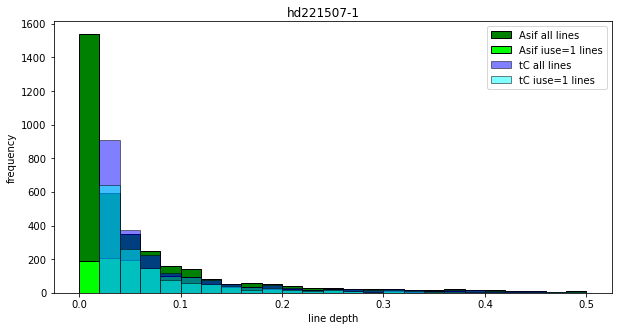

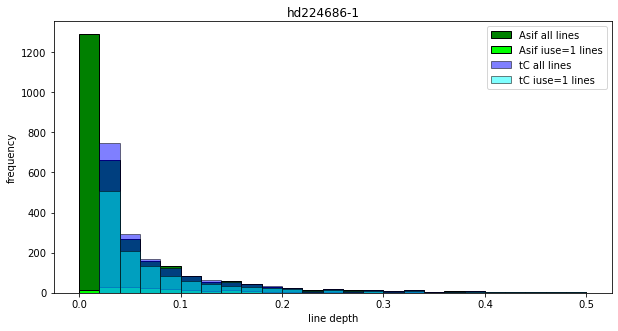

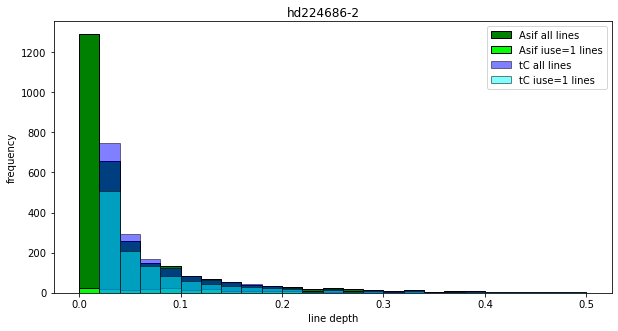

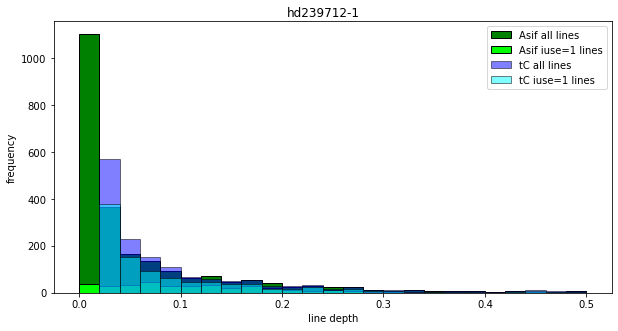

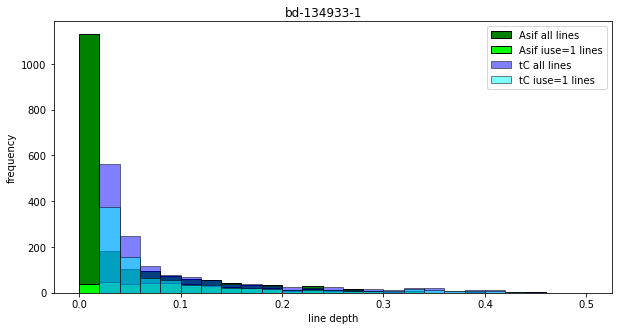

In [ ]:



with PdfPages('{}/Mask_depth_hist_AsifMaskCleanTweak.pdf'.format(path)) as pdf:
  for i in range(len(StarData["Name"])):

    star = StarData["Name"][i]
    modelcode = StarData["ModelCode"][i].upper()

    for obs in range(1,StarData['Nobs'][i]+1):


      Asif_mask = '{}/02-Mask-calculations/MaskCleaning/AsifMaskCleanTweak_tellClean/{}_clean_{}.mask_auto_twk'.format(path,star,obs)

      A_mask = pol.iolsd.read_mask(fname=Asif_mask)

      AM=[]
      for i in range(len(A_mask.iuse)):
        if A_mask.iuse[i] != 0:
          AM.append(A_mask.depth[i])


      if obs==1:
        tellClean_mask = '{}/02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,modelcode)
        tC_mask = pol.iolsd.read_mask(fname=tellClean_mask)
        tCM =[]
        for i in range(len(tC_mask.iuse)):
          if tC_mask.iuse[i] != 0:
            tCM.append(tC_mask.depth[i])

      fig, ax = plt.subplots(1,1, figsize=(10,5))

      ax.set_xlabel('line depth')
      ax.set_ylabel('frequency')
      b=25



      ax.hist(A_mask.depth,edgecolor='black',alpha = 1 ,bins=b, color='green',range=[0, 0.5],label='Asif all lines')
      ax.hist(AM,bins=b,edgecolor='black',alpha = 1,color='lime',range=[0, 0.5],label='Asif iuse=1 lines')

      ax.hist(tC_mask.depth,edgecolor='black',bins=b ,color ='blue',alpha = 0.5 ,range=[0, 0.5],label='tC all lines')
      ax.hist(tCM,bins=b,edgecolor='black' ,color = 'cyan',alpha = 0.5 ,range=[0, 0.5] ,label ='tC iuse=1 lines')

      ax.legend()
      fig.suptitle(star + '-'+ str(obs),y=0.92)

      pdf.savefig(fig)

C:\Users\pjsta\AppData\Local\Temp/ipykernel_4428/509543412.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(10,5))


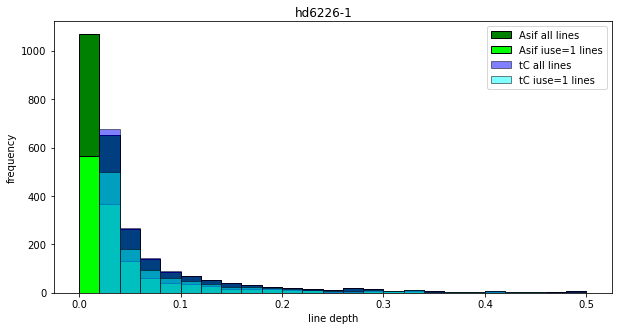

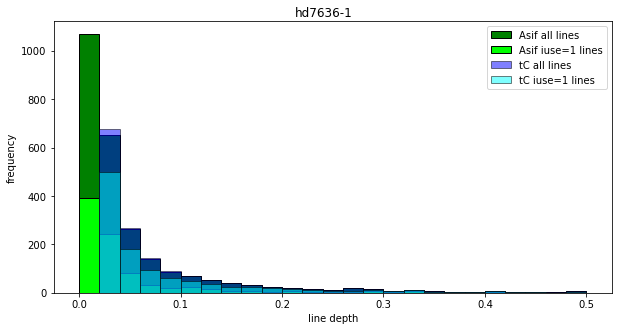

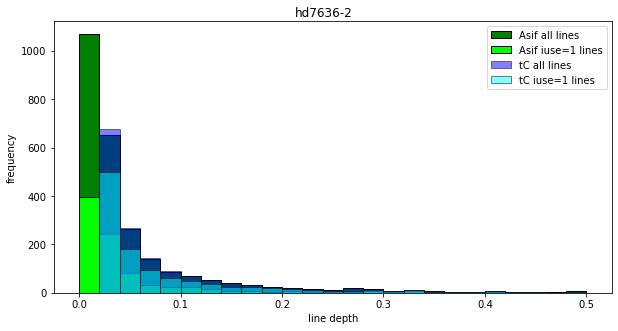

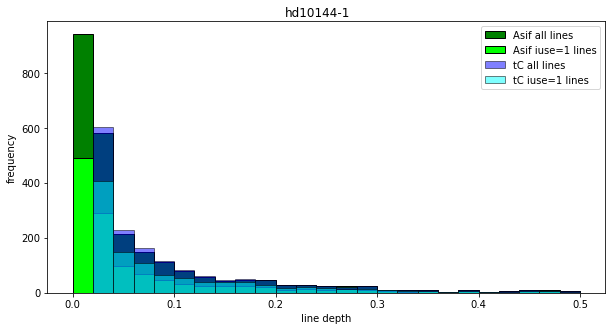

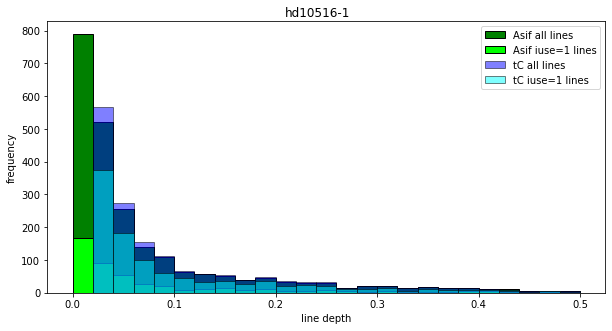

...

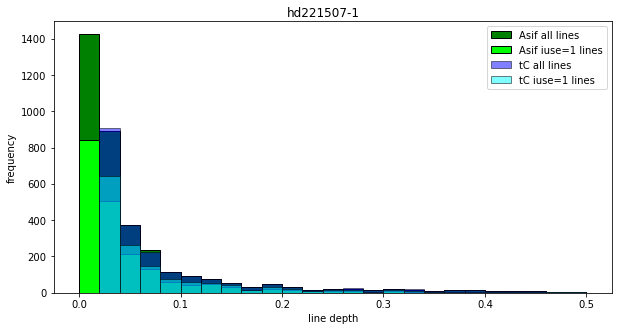

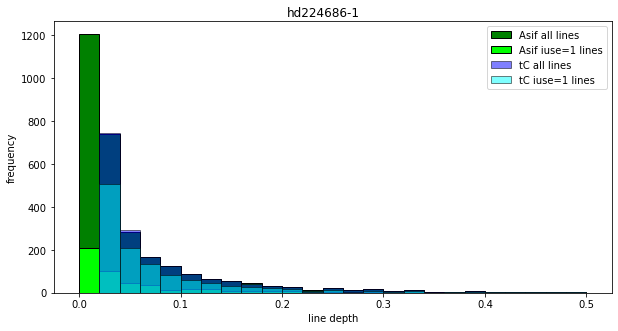

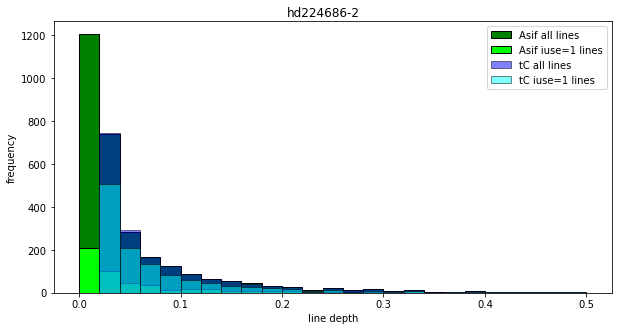

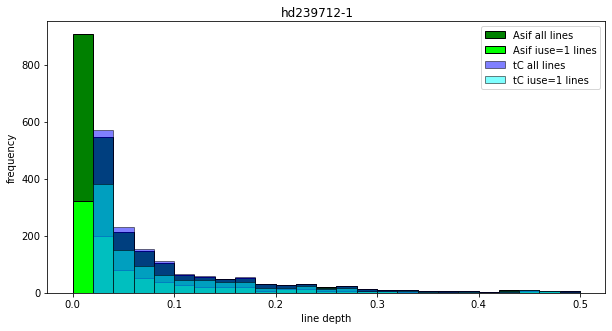

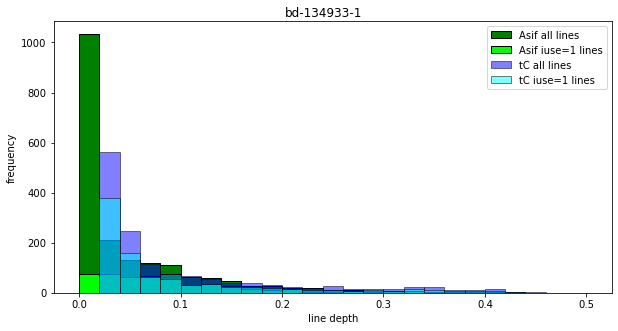

In [ ]:



with PdfPages('{}/Mask_depth_hist_AsifClean.pdf'.format(path)) as pdf:
  for i in range(len(StarData["Name"])):

    star = StarData["Name"][i]
    modelcode = StarData["ModelCode"][i].upper()

    for obs in range(1,StarData['Nobs'][i]+1):


      Asif_mask = '{}/02-Mask-calculations/MaskCleaning/AsifMaskClean_tellClean/{}_clean_{}.mask'.format(path,star,obs)

      A_mask = pol.iolsd.read_mask(fname=Asif_mask)

      AM=[]
      for i in range(len(A_mask.iuse)):
        if A_mask.iuse[i] != 0:
          AM.append(A_mask.depth[i])


      if obs==1:
        tellClean_mask = '{}/02-Mask-calculations/MaskCleaning/depth0.02_tellClean/{}_depth0.02.mask'.format(path,modelcode)
        tC_mask = pol.iolsd.read_mask(fname=tellClean_mask)
        tCM =[]
        for i in range(len(tC_mask.iuse)):
          if tC_mask.iuse[i] != 0:
            tCM.append(tC_mask.depth[i])

      fig, ax = plt.subplots(1,1, figsize=(10,5))

      ax.set_xlabel('line depth')
      ax.set_ylabel('frequency')
      b=25



      ax.hist(A_mask.depth,edgecolor='black',alpha = 1 ,bins=b, color='green',range=[0, 0.5],label='Asif all lines')
      ax.hist(AM,bins=b,edgecolor='black',alpha = 1,color='lime',range=[0, 0.5],label='Asif iuse=1 lines')

      ax.hist(tC_mask.depth,edgecolor='black',bins=b ,color ='blue',alpha = 0.5 ,range=[0, 0.5],label='tC all lines')
      ax.hist(tCM,bins=b,edgecolor='black' ,color = 'cyan',alpha = 0.5 ,range=[0, 0.5] ,label ='tC iuse=1 lines')

      ax.legend()
      fig.suptitle(star + '-'+ str(obs),y=0.92)

      pdf.savefig(fig)